In [14]:
pip install pandas numpy matplotlib seaborn plotly folium scikit-learn jupyter


   -------------------- ------------------- 3/6 [branca]
   --------------------------------- ------ 5/6 [folium]
   --------------------------------- ------ 5/6 [folium]
   ---------------------------------------- 6/6 [folium]

Note: you may need to restart the kernel to use updated packages.


In [5]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore') 

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
%matplotlib inline

In [7]:
df = pd.read_csv('AB_NYC_2019.csv')

print("📊 Dataset Overview")
print("=" * 50)
print(f"Dataset Shape: {df.shape}")
print(f"Number of listings: {len(df)}")
print(f"Number of features: {len(df.columns)}")

print("\nFirst 5 rows:")
display(df.head())

📊 Dataset Overview
Dataset Shape: (48895, 16)
Number of listings: 48895
Number of features: 16

First 5 rows:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [8]:
print("📋 Dataset Information")
print("=" * 50)
df.info()

print("\n📈 Basic Statistics")
print("=" * 50)
display(df.describe())

📋 Dataset Information
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_revie

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [18]:
print("🔍 Missing Values Analysis")
print("=" * 50)
missing_values = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100

missing_df = pd.DataFrame({
    'Missing Count': missing_values,
    'Missing Percentage': missing_percent
})
display(missing_df[missing_df['Missing Count'] > 0])

🔍 Missing Values Analysis


,Missing Count,Missing Percentage
name,16,0.032723
host_name,21,0.042949
last_review,10052,20.558339
reviews_per_month,10052,20.558339


In [19]:
print("🧹 Data Cleaning")
print("=" * 50)

df_clean = df.copy()

df_clean['reviews_per_month'] = df_clean['reviews_per_month'].fillna(0)
df_clean['last_review'] = pd.to_datetime(df_clean['last_review'], errors='coerce')

initial_count = len(df_clean)
df_clean = df_clean.drop_duplicates()
final_count = len(df_clean)

print(f"Removed {initial_count - final_count} duplicate rows")
print(f"Final dataset shape: {df_clean.shape}")

df_clean['price_per_night'] = df_clean['price'] / df_clean['minimum_nights']
df_clean['has_reviews'] = df_clean['number_of_reviews'] > 0
df_clean['review_recency'] = (pd.to_datetime('2019-12-31') - df_clean['last_review']).dt.days
df_clean['review_recency'] = df_clean['review_recency'].fillna(365)  # Fill with max if no review

print("\n✅ Data cleaning completed!")

🧹 Data Cleaning
Removed 0 duplicate rows
Final dataset shape: (48895, 16)

✅ Data cleaning completed!


💰 Price Distribution Analysis


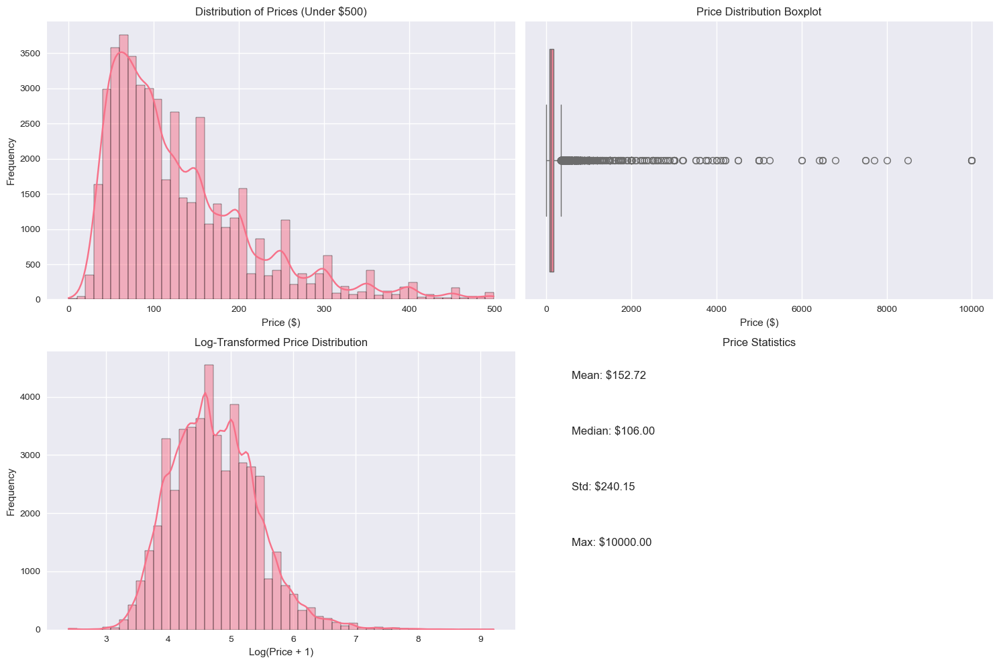

💰 Price Statistics:
Average price: $152.72
Median price: $106.00
Most expensive listing: $10000.00


In [20]:
print("💰 Price Distribution Analysis")
print("=" * 50)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
price_under_500 = df_clean[df_clean['price'] < 500]['price']
sns.histplot(price_under_500, bins=50, kde=True)
plt.title('Distribution of Prices (Under $500)')
plt.xlabel('Price ($)')
plt.ylabel('Frequency')

plt.subplot(2, 2, 2)
sns.boxplot(x=df_clean['price'])
plt.title('Price Distribution Boxplot')
plt.xlabel('Price ($)')

plt.subplot(2, 2, 3)
log_price = np.log1p(df_clean[df_clean['price'] > 0]['price'])
sns.histplot(log_price, bins=50, kde=True)
plt.title('Log-Transformed Price Distribution')
plt.xlabel('Log(Price + 1)')
plt.ylabel('Frequency')

plt.subplot(2, 2, 4)
price_stats = df_clean['price'].describe()
plt.text(0.1, 0.9, f"Mean: ${price_stats['mean']:.2f}", fontsize=12, transform=plt.gca().transAxes)
plt.text(0.1, 0.7, f"Median: ${price_stats['50%']:.2f}", fontsize=12, transform=plt.gca().transAxes)
plt.text(0.1, 0.5, f"Std: ${price_stats['std']:.2f}", fontsize=12, transform=plt.gca().transAxes)
plt.text(0.1, 0.3, f"Max: ${price_stats['max']:.2f}", fontsize=12, transform=plt.gca().transAxes)
plt.axis('off')
plt.title('Price Statistics')

plt.tight_layout()
plt.show()

print(f"💰 Price Statistics:")
print(f"Average price: ${df_clean['price'].mean():.2f}")
print(f"Median price: ${df_clean['price'].median():.2f}")
print(f"Most expensive listing: ${df_clean['price'].max():.2f}")

🏙️ Neighborhood Group Analysis


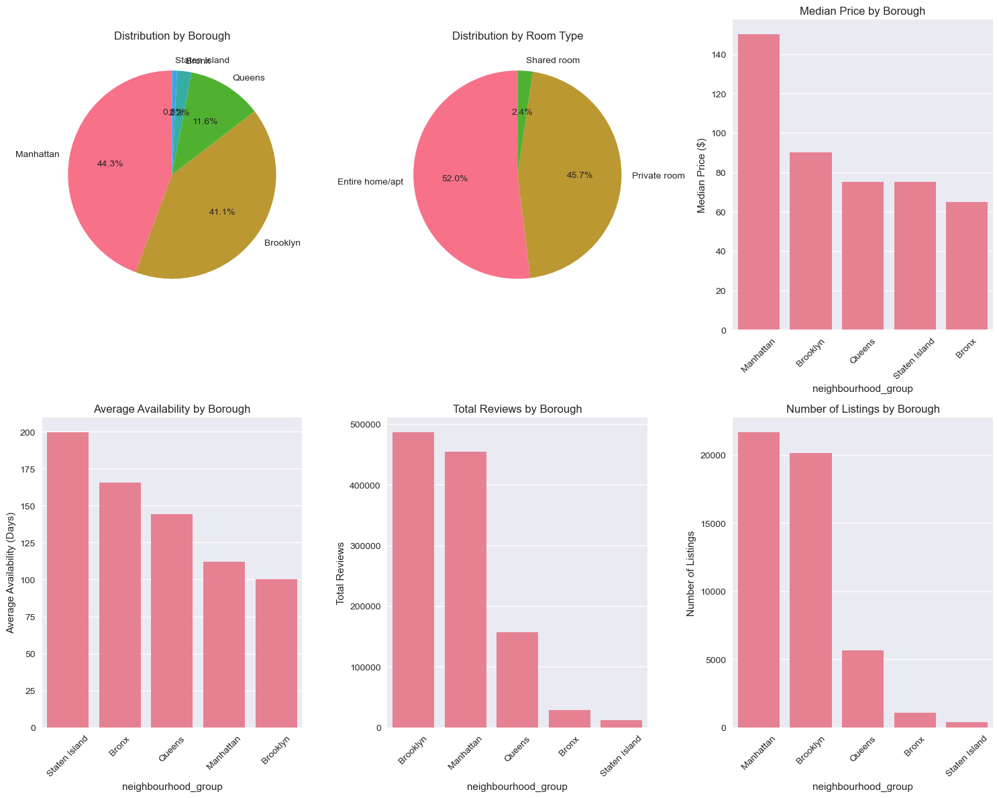


📊 Borough Summary:

Brooklyn:
  Listings: 20104 (41.1%)
  Avg Price: $124.38
  Avg Availability: 100.2 days
  Most common room type: Private room

Manhattan:
  Listings: 21661 (44.3%)
  Avg Price: $196.88
  Avg Availability: 112.0 days
  Most common room type: Entire home/apt

Queens:
  Listings: 5666 (11.6%)
  Avg Price: $99.52
  Avg Availability: 144.5 days
  Most common room type: Private room

Staten Island:
  Listings: 373 (0.8%)
  Avg Price: $114.81
  Avg Availability: 199.7 days
  Most common room type: Private room

Bronx:
  Listings: 1091 (2.2%)
  Avg Price: $87.50
  Avg Availability: 165.8 days
  Most common room type: Private room


In [27]:
print("🏙️ Neighborhood Group Analysis")
print("=" * 50)

try:
    analysis_df = df_clean
except NameError:
    analysis_df = df.copy()
    print("⚠️ Using original dataframe - run data cleaning cell for enhanced analysis")

plt.figure(figsize=(15, 12))

plt.subplot(2, 3, 1)
neighbourhood_counts = analysis_df['neighbourhood_group'].value_counts()
plt.pie(neighbourhood_counts.values, labels=neighbourhood_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution by Borough')

plt.subplot(2, 3, 2)
room_type_counts = analysis_df['room_type'].value_counts()
plt.pie(room_type_counts.values, labels=room_type_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution by Room Type')

plt.subplot(2, 3, 3)
price_by_borough = analysis_df.groupby('neighbourhood_group')['price'].median().sort_values(ascending=False)
sns.barplot(x=price_by_borough.index, y=price_by_borough.values)
plt.title('Median Price by Borough')
plt.xticks(rotation=45)
plt.ylabel('Median Price ($)')

plt.subplot(2, 3, 4)
availability_by_borough = analysis_df.groupby('neighbourhood_group')['availability_365'].mean().sort_values(ascending=False)
sns.barplot(x=availability_by_borough.index, y=availability_by_borough.values)
plt.title('Average Availability by Borough')
plt.xticks(rotation=45)
plt.ylabel('Average Availability (Days)')

plt.subplot(2, 3, 5)
reviews_by_borough = analysis_df.groupby('neighbourhood_group')['number_of_reviews'].sum().sort_values(ascending=False)
sns.barplot(x=reviews_by_borough.index, y=reviews_by_borough.values)
plt.title('Total Reviews by Borough')
plt.xticks(rotation=45)
plt.ylabel('Total Reviews')

plt.subplot(2, 3, 6)
sns.barplot(x=neighbourhood_counts.index, y=neighbourhood_counts.values)
plt.title('Number of Listings by Borough')
plt.xticks(rotation=45)
plt.ylabel('Number of Listings')

plt.tight_layout()
plt.show()

print("\n📊 Borough Summary:")
for borough in analysis_df['neighbourhood_group'].unique():
    borough_data = analysis_df[analysis_df['neighbourhood_group'] == borough]
    print(f"\n{borough}:")
    print(f"  Listings: {len(borough_data)} ({len(borough_data)/len(analysis_df)*100:.1f}%)")
    print(f"  Avg Price: ${borough_data['price'].mean():.2f}")
    print(f"  Avg Availability: {borough_data['availability_365'].mean():.1f} days")
    print(f"  Most common room type: {borough_data['room_type'].mode().iloc[0]}")

🏠 Room Type Analysis


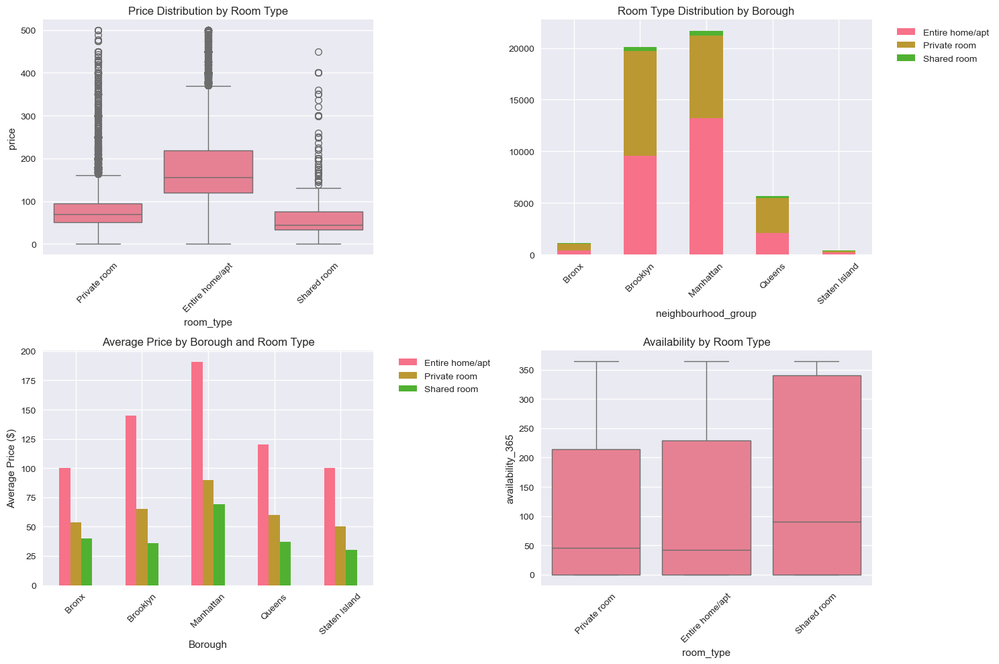


📊 Room Type Summary:

Private room:
  Count: 22326 (45.7%)
  Avg Price: $89.78
  Median Price: $70.00
  Avg Minimum Nights: 5.4

Entire home/apt:
  Count: 25409 (52.0%)
  Avg Price: $211.79
  Median Price: $160.00
  Avg Minimum Nights: 8.5

Shared room:
  Count: 1160 (2.4%)
  Avg Price: $70.13
  Median Price: $45.00
  Avg Minimum Nights: 6.5


In [21]:
print("🏠 Room Type Analysis")
print("=" * 50)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
sns.boxplot(data=df_clean[df_clean['price'] < 500], x='room_type', y='price')
plt.title('Price Distribution by Room Type')
plt.xticks(rotation=45)

plt.subplot(2, 2, 2)
room_borough = pd.crosstab(df_clean['neighbourhood_group'], df_clean['room_type'])
room_borough.plot(kind='bar', stacked=True, ax=plt.gca())
plt.title('Room Type Distribution by Borough')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(2, 2, 3)
avg_price_room_borough = df_clean.groupby(['neighbourhood_group', 'room_type'])['price'].median().unstack()
avg_price_room_borough.plot(kind='bar', ax=plt.gca())
plt.title('Average Price by Borough and Room Type')
plt.xlabel('Borough')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(2, 2, 4)
sns.boxplot(data=df_clean, x='room_type', y='availability_365')
plt.title('Availability by Room Type')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

print("\n📊 Room Type Summary:")
for room_type in df_clean['room_type'].unique():
    room_data = df_clean[df_clean['room_type'] == room_type]
    print(f"\n{room_type}:")
    print(f"  Count: {len(room_data)} ({len(room_data)/len(df_clean)*100:.1f}%)")
    print(f"  Avg Price: ${room_data['price'].mean():.2f}")
    print(f"  Median Price: ${room_data['price'].median():.2f}")
    print(f"  Avg Minimum Nights: {room_data['minimum_nights'].mean():.1f}")

📍 Top Neighborhoods Analysis


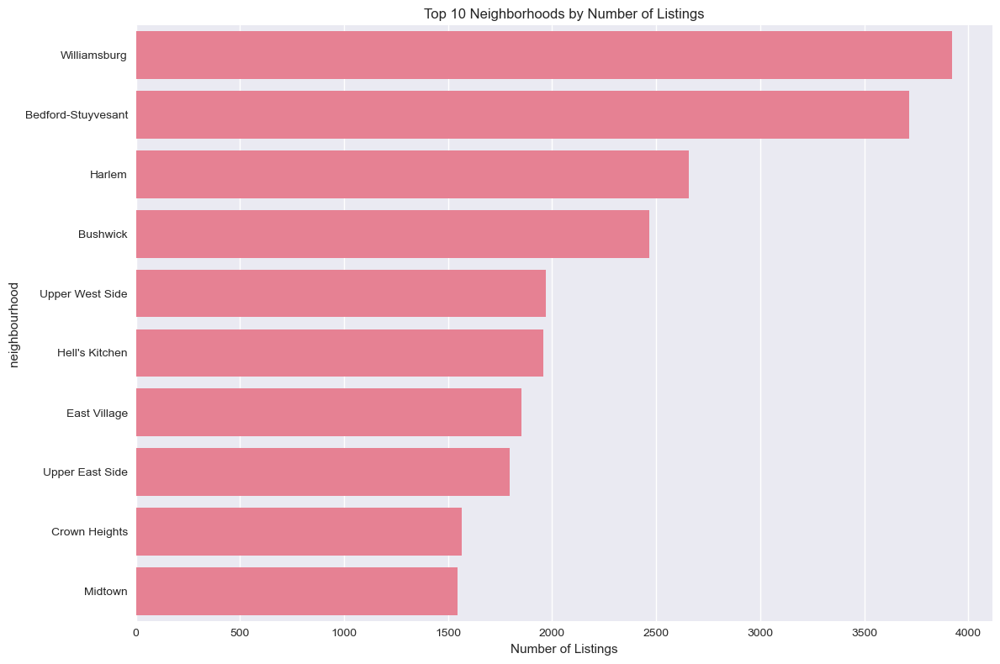


🏆 Top 10 Neighborhoods Details:


,Neighborhood,Borough,Listings,Avg Price,Median Price,Avg Reviews,Avg Availability
0,Williamsburg,Brooklyn,3920,143.802806,105.0,21.792602,74.722704
1,Bedford-Stuyvesant,Brooklyn,3714,107.678244,80.0,29.712439,116.634626
2,Harlem,Manhattan,2658,118.974041,89.0,28.578631,106.577502
3,Bushwick,Brooklyn,2465,84.800406,65.0,21.303854,95.550913
4,Upper West Side,Manhattan,1971,210.918316,150.0,18.294267,96.583460
5,Hell's Kitchen,Manhattan,1958,204.794178,168.0,25.652196,138.846782
6,East Village,Manhattan,1853,186.083108,150.0,24.106854,74.623853
7,Upper East Side,Manhattan,1798,188.948276,149.0,17.622914,112.798109
8,Crown Heights,Brooklyn,1564,112.480179,85.0,23.278772,96.020460
9,Midtown,Manhattan,1545,282.719094,210.0,12.585113,157.703560


In [28]:
print("📍 Top Neighborhoods Analysis")
print("=" * 50)

if 'df_clean' not in globals():
    df_clean = df.copy()

top_neighborhoods = df_clean['neighbourhood'].value_counts().head(10)

plt.figure(figsize=(12, 8))
sns.barplot(x=top_neighborhoods.values, y=top_neighborhoods.index)
plt.title('Top 10 Neighborhoods by Number of Listings')
plt.xlabel('Number of Listings')
plt.tight_layout()
plt.show()

print("\n🏆 Top 10 Neighborhoods Details:")
top_neighborhoods_data = []
for neighborhood in top_neighborhoods.index:
    hood_data = df_clean[df_clean['neighbourhood'] == neighborhood]
    top_neighborhoods_data.append({
        'Neighborhood': neighborhood,
        'Borough': hood_data['neighbourhood_group'].iloc[0],
        'Listings': len(hood_data),
        'Avg Price': hood_data['price'].mean(),
        'Median Price': hood_data['price'].median(),
        'Avg Reviews': hood_data['number_of_reviews'].mean(),
        'Avg Availability': hood_data['availability_365'].mean()
    })

top_neighborhoods_df = pd.DataFrame(top_neighborhoods_data)
display(top_neighborhoods_df)

🗺️ Geographic Distribution Analysis


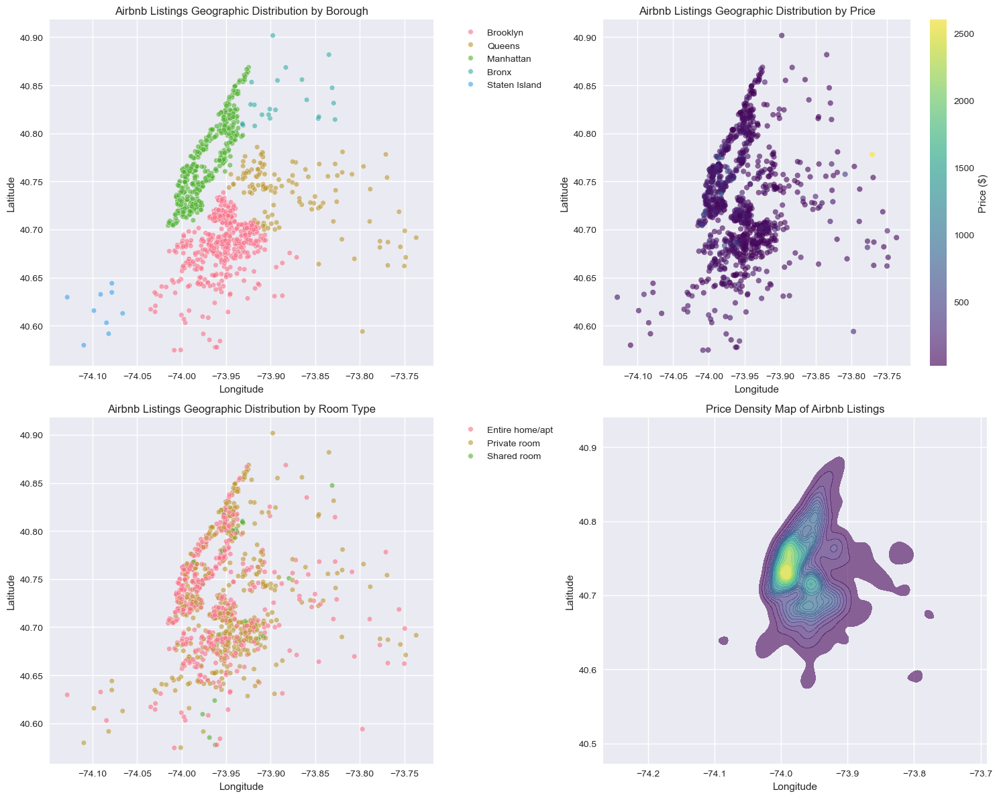

In [22]:
print("🗺️ Geographic Distribution Analysis")
print("=" * 50)

sample_df = df_clean.sample(1000, random_state=42)

plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
sns.scatterplot(data=sample_df, x='longitude', y='latitude', hue='neighbourhood_group', 
               alpha=0.6, s=30)
plt.title('Airbnb Listings Geographic Distribution by Borough')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(2, 2, 2)
scatter = plt.scatter(sample_df['longitude'], sample_df['latitude'], 
                     c=sample_df['price'], cmap='viridis', alpha=0.6, s=30)
plt.colorbar(scatter, label='Price ($)')
plt.title('Airbnb Listings Geographic Distribution by Price')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.subplot(2, 2, 3)
sns.scatterplot(data=sample_df, x='longitude', y='latitude', hue='room_type', 
               alpha=0.6, s=30)
plt.title('Airbnb Listings Geographic Distribution by Room Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(2, 2, 4)
sns.kdeplot(data=df_clean, x='longitude', y='latitude', weights='price', 
           fill=True, cmap='viridis', alpha=0.6, levels=20)
plt.title('Price Density Map of Airbnb Listings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.tight_layout()
plt.show()

👤 Host Analysis


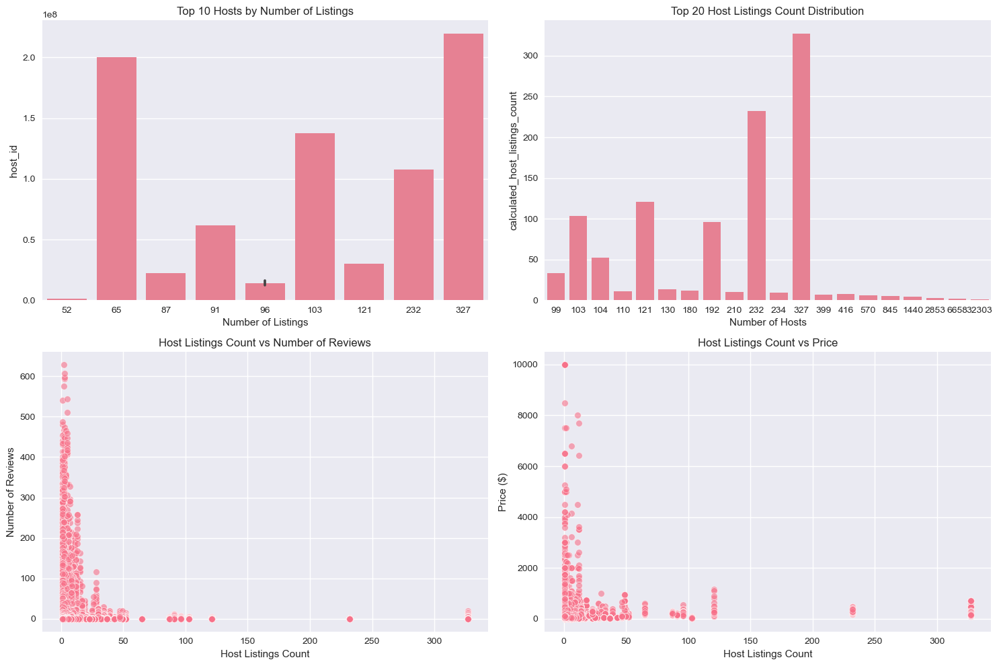


📊 Host Statistics:
Total unique hosts: 37457
Average listings per host: 7.1
Median listings per host: 1.0
Host with most listings: 219517861 with 327 listings

Professional hosts (10+ listings): 115
Listings by professional hosts: 3177 (6.5%)


In [23]:
print("👤 Host Analysis")
print("=" * 50)

top_hosts = df_clean['host_id'].value_counts().head(10)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
sns.barplot(x=top_hosts.values, y=top_hosts.index)
plt.title('Top 10 Hosts by Number of Listings')
plt.xlabel('Number of Listings')

plt.subplot(2, 2, 2)
host_listings_dist = df_clean['calculated_host_listings_count'].value_counts().head(20)
sns.barplot(x=host_listings_dist.values, y=host_listings_dist.index)
plt.title('Top 20 Host Listings Count Distribution')
plt.xlabel('Number of Hosts')

plt.subplot(2, 2, 3)
sns.scatterplot(data=df_clean, x='calculated_host_listings_count', y='number_of_reviews', alpha=0.6)
plt.title('Host Listings Count vs Number of Reviews')
plt.xlabel('Host Listings Count')
plt.ylabel('Number of Reviews')

plt.subplot(2, 2, 4)
sns.scatterplot(data=df_clean, x='calculated_host_listings_count', y='price', alpha=0.6)
plt.title('Host Listings Count vs Price')
plt.xlabel('Host Listings Count')
plt.ylabel('Price ($)')

plt.tight_layout()
plt.show()

print("\n📊 Host Statistics:")
print(f"Total unique hosts: {df_clean['host_id'].nunique()}")
print(f"Average listings per host: {df_clean['calculated_host_listings_count'].mean():.1f}")
print(f"Median listings per host: {df_clean['calculated_host_listings_count'].median()}")
print(f"Host with most listings: {top_hosts.index[0]} with {top_hosts.values[0]} listings")

professional_hosts = df_clean[df_clean['calculated_host_listings_count'] >= 10]
print(f"\nProfessional hosts (10+ listings): {len(professional_hosts['host_id'].unique())}")
print(f"Listings by professional hosts: {len(professional_hosts)} ({len(professional_hosts)/len(df_clean)*100:.1f}%)")

⭐ Reviews and Availability Analysis


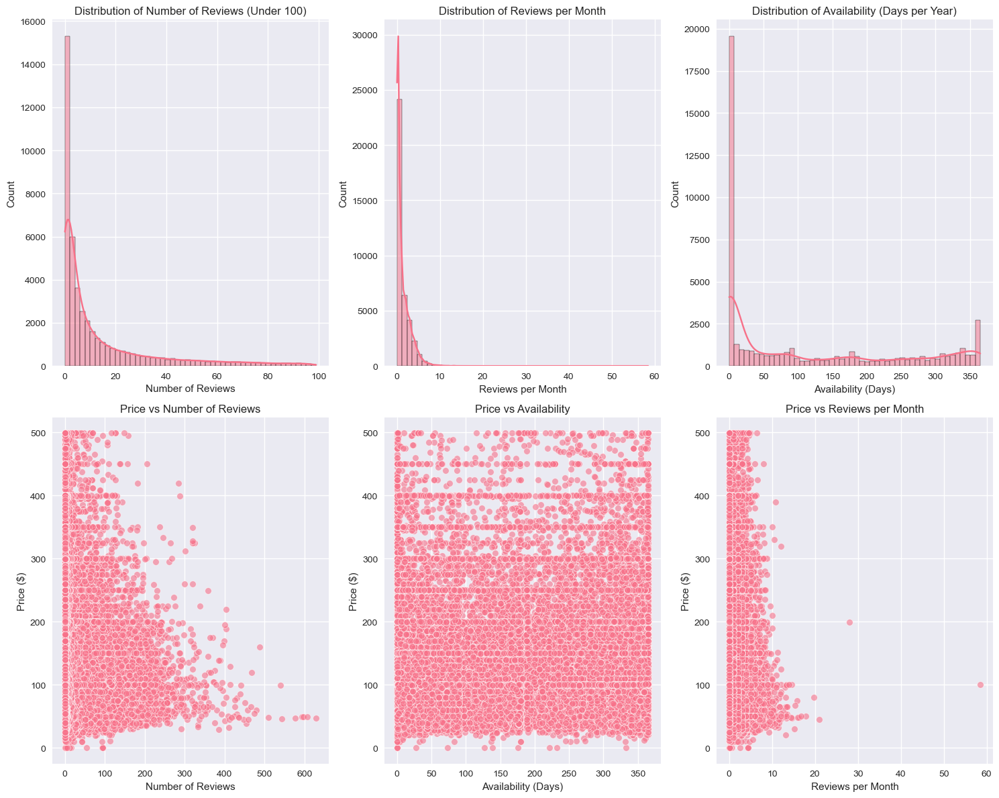


📊 Reviews and Availability Statistics:
Average number of reviews: 23.3
Average reviews per month: 1.37
Average availability: 112.8 days per year
Percentage with no reviews: 20.6%


In [29]:
print("⭐ Reviews and Availability Analysis")
print("=" * 50)

if 'df_clean' not in globals():
    df_clean = df.copy()
    print("⚠️ Created df_clean from original df - run data cleaning cell for enhanced features")

plt.figure(figsize=(15, 12))

plt.subplot(2, 3, 1)
reviews_under_100 = df_clean[df_clean['number_of_reviews'] < 100]['number_of_reviews']
sns.histplot(reviews_under_100, bins=50, kde=True)
plt.title('Distribution of Number of Reviews (Under 100)')
plt.xlabel('Number of Reviews')

plt.subplot(2, 3, 2)
reviews_per_month = df_clean[df_clean['reviews_per_month'] > 0]['reviews_per_month']
sns.histplot(reviews_per_month, bins=50, kde=True)
plt.title('Distribution of Reviews per Month')

plt.subplot(2, 3, 3)
sns.histplot(df_clean['availability_365'], bins=50, kde=True)
plt.title('Distribution of Availability (Days per Year)')
plt.xlabel('Availability (Days)')

plt.subplot(2, 3, 4)
sns.scatterplot(data=df_clean[df_clean['price'] < 500], x='number_of_reviews', y='price', alpha=0.6)
plt.title('Price vs Number of Reviews')
plt.xlabel('Number of Reviews')
plt.ylabel('Price ($)')

plt.subplot(2, 3, 5)
sns.scatterplot(data=df_clean[df_clean['price'] < 500], x='availability_365', y='price', alpha=0.6)
plt.title('Price vs Availability')
plt.xlabel('Availability (Days)')
plt.ylabel('Price ($)')

plt.subplot(2, 3, 6)
sns.scatterplot(data=df_clean[df_clean['price'] < 500], x='reviews_per_month', y='price', alpha=0.6)
plt.title('Price vs Reviews per Month')
plt.xlabel('Reviews per Month')
plt.ylabel('Price ($)')

plt.tight_layout()
plt.show()

print("\n📊 Reviews and Availability Statistics:")
print(f"Average number of reviews: {df_clean['number_of_reviews'].mean():.1f}")
print(f"Average reviews per month: {df_clean[df_clean['reviews_per_month'] > 0]['reviews_per_month'].mean():.2f}")
print(f"Average availability: {df_clean['availability_365'].mean():.1f} days per year")
print(f"Percentage with no reviews: {(df_clean['number_of_reviews'] == 0).sum() / len(df_clean) * 100:.1f}%")

📊 Correlation Analysis


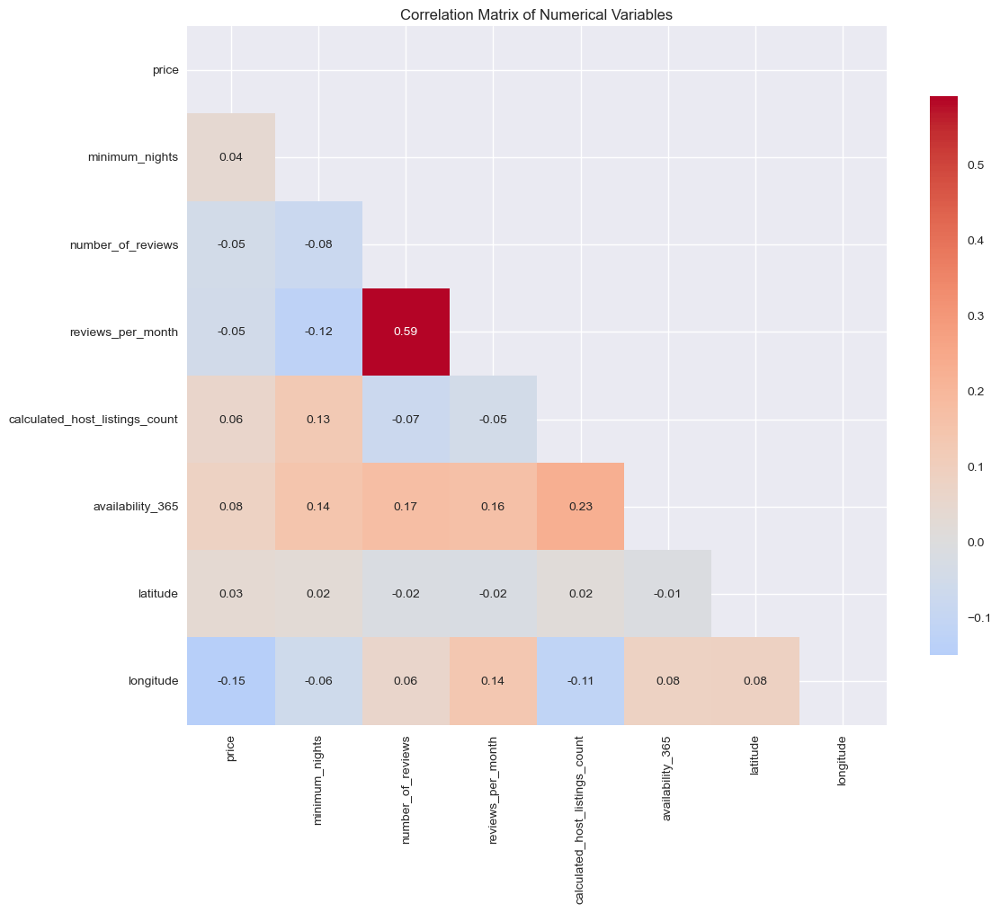


🔍 Key Correlations:
Price vs Availability: 0.082
Price vs Number of Reviews: -0.048
Number of Reviews vs Reviews per Month: 0.589


In [24]:
print("📊 Correlation Analysis")
print("=" * 50)

numerical_cols = ['price', 'minimum_nights', 'number_of_reviews', 
                 'reviews_per_month', 'calculated_host_listings_count', 
                 'availability_365', 'latitude', 'longitude']

correlation_matrix = df_clean[numerical_cols].corr()

plt.figure(figsize=(12, 10))
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.2f', cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

print("\n🔍 Key Correlations:")
print(f"Price vs Availability: {correlation_matrix.loc['price', 'availability_365']:.3f}")
print(f"Price vs Number of Reviews: {correlation_matrix.loc['price', 'number_of_reviews']:.3f}")
print(f"Number of Reviews vs Reviews per Month: {correlation_matrix.loc['number_of_reviews', 'reviews_per_month']:.3f}")

📅 Time Series Analysis - Review Activity


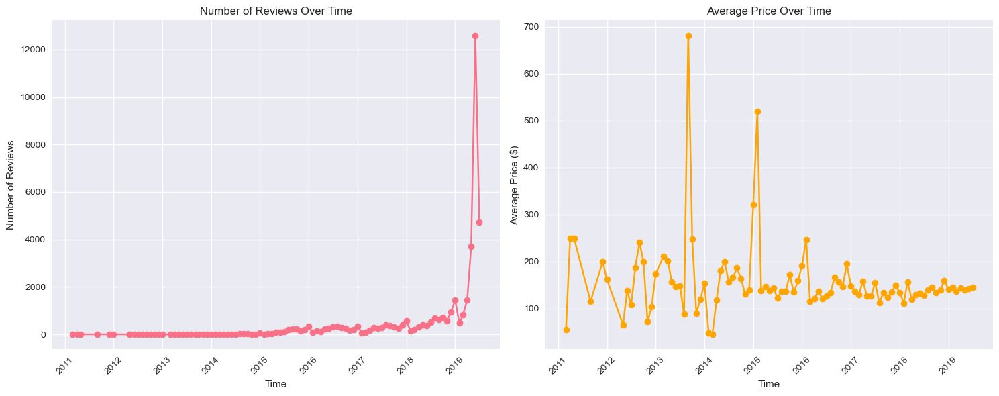


📈 Time Series Insights:
Review data spans from 2011-03 to 2019-07
Peak review month: 2019-06
Highest average price month: 2013-09


In [35]:
print("📅 Time Series Analysis - Review Activity")
print("=" * 50)

if 'df_clean' not in globals():
    df_clean = df.copy()

df_clean['last_review'] = pd.to_datetime(df_clean['last_review'], errors='coerce')

df_clean['last_review_year'] = df_clean['last_review'].dt.year
df_clean['last_review_month'] = df_clean['last_review'].dt.month

reviews_by_time = df_clean.groupby(['last_review_year', 'last_review_month']).size().reset_index(name='count')
reviews_by_time = reviews_by_time.dropna()

reviews_by_time['last_review_year'] = reviews_by_time['last_review_year'].astype(int)
reviews_by_time['last_review_month'] = reviews_by_time['last_review_month'].astype(int)

reviews_by_time['date'] = reviews_by_time['last_review_year'].astype(str) + '-' + reviews_by_time['last_review_month'].astype(str)
reviews_by_time['date'] = pd.to_datetime(reviews_by_time['date'], format='%Y-%m')

plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.plot(reviews_by_time['date'], reviews_by_time['count'], marker='o')
plt.title('Number of Reviews Over Time')
plt.xlabel('Time')
plt.ylabel('Number of Reviews')
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)

price_by_time = df_clean.groupby(['last_review_year', 'last_review_month'])['price'].mean().reset_index()
price_by_time = price_by_time.dropna()

price_by_time['last_review_year'] = price_by_time['last_review_year'].astype(int)
price_by_time['last_review_month'] = price_by_time['last_review_month'].astype(int)

price_by_time['date'] = price_by_time['last_review_year'].astype(str) + '-' + price_by_time['last_review_month'].astype(str)
price_by_time['date'] = pd.to_datetime(price_by_time['date'], format='%Y-%m')

plt.plot(price_by_time['date'], price_by_time['price'], marker='o', color='orange')
plt.title('Average Price Over Time')
plt.xlabel('Time')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

print("\n📈 Time Series Insights:")
print(f"Review data spans from {reviews_by_time['date'].min().strftime('%Y-%m')} to {reviews_by_time['date'].max().strftime('%Y-%m')}")
print(f"Peak review month: {reviews_by_time.loc[reviews_by_time['count'].idxmax(), 'date'].strftime('%Y-%m')}")
print(f"Highest average price month: {price_by_time.loc[price_by_time['price'].idxmax(), 'date'].strftime('%Y-%m')}")

In [25]:
print("💡 BUSINESS INSIGHTS AND RECOMMENDATIONS")
print("=" * 60)

most_expensive_borough = df_clean.groupby('neighbourhood_group')['price'].median().idxmax()
most_expensive_price = df_clean.groupby('neighbourhood_group')['price'].median().max()

most_common_room_type = df_clean['room_type'].value_counts().idxmax()

value_neighborhoods = df_clean.groupby('neighbourhood').agg({
    'price': 'median',
    'number_of_reviews': 'mean',
    'id': 'count'
}).round(2)
value_neighborhoods.columns = ['median_price', 'avg_reviews', 'listing_count']
value_neighborhoods = value_neighborhoods[value_neighborhoods['listing_count'] > 10]  # At least 10 listings
value_neighborhoods['value_score'] = (value_neighborhoods['avg_reviews'] / value_neighborhoods['median_price']).round(3)
best_value_neighborhoods = value_neighborhoods.nlargest(5, 'value_score')

print("🏆 KEY FINDINGS:")
print("=" * 40)
print(f"1. Most expensive borough: {most_expensive_borough} (${most_expensive_price:.2f} median)")
print(f"2. Most common room type: {most_common_room_type}")
print(f"3. Average price per night: ${df_clean['price'].mean():.2f}")
print(f"4. Most reviewed listing: '{df_clean.loc[df_clean['number_of_reviews'].idxmax(), 'name']}'")
print(f"5. Best availability: {df_clean['availability_365'].max()} days per year")

print("\n💰 PRICING INSIGHTS:")
print("=" * 40)
for borough in df_clean['neighbourhood_group'].unique():
    borough_data = df_clean[df_clean['neighbourhood_group'] == borough]
    for room_type in df_clean['room_type'].unique():
        room_data = borough_data[borough_data['room_type'] == room_type]
        if len(room_data) > 0:
            print(f"{borough} - {room_type}: ${room_data['price'].median():.2f} median")

print("\n🏅 BEST VALUE NEIGHBORHOODS (High reviews, Low price):")
print("=" * 50)
display(best_value_neighborhoods.head())

print("\n🎯 RECOMMENDATIONS:")
print("=" * 40)
print("✅ FOR HOSTS:")
print("   • Manhattan hosts can command premium prices, especially for entire homes")
print("   • Brooklyn offers good balance of demand and pricing")
print("   • Consider lowering minimum nights to increase booking frequency")
print("   • Maintain high availability for better review frequency")

print("\n✅ FOR TRAVELERS:")
print("   • Best value: Brooklyn and Queens neighborhoods")
print("   • Private rooms offer best price-to-comfort ratio")
print("   • Book in advance for popular Manhattan locations")
print("   • Consider slightly less popular neighborhoods for better deals")

print("\n✅ FOR INVESTORS:")
print("   • Focus on Manhattan for luxury market")
print("   • Brooklyn shows strong growth potential")
print("   • Entire homes/apartments generate highest revenue")
print("   • Professional hosts dominate the market - consider portfolio approach")

💡 BUSINESS INSIGHTS AND RECOMMENDATIONS
🏆 KEY FINDINGS:
1. Most expensive borough: Manhattan ($150.00 median)
2. Most common room type: Entire home/apt
3. Average price per night: $152.72
4. Most reviewed listing: 'Room near JFK Queen Bed'
5. Best availability: 365 days per year

💰 PRICING INSIGHTS:
Brooklyn - Private room: $65.00 median
Brooklyn - Entire home/apt: $145.00 median
Brooklyn - Shared room: $36.00 median
Manhattan - Private room: $90.00 median
Manhattan - Entire home/apt: $191.00 median
Manhattan - Shared room: $69.00 median
Queens - Private room: $60.00 median
Queens - Entire home/apt: $120.00 median
Queens - Shared room: $37.00 median
Staten Island - Private room: $50.00 median
Staten Island - Entire home/apt: $100.00 median
Staten Island - Shared room: $30.00 median
Bronx - Private room: $53.50 median
Bronx - Entire home/apt: $100.00 median
Bronx - Shared room: $40.00 median

🏅 BEST VALUE NEIGHBORHOODS (High reviews, Low price):


,median_price,avg_reviews,listing_count,value_score
neighbourhood,,,,
East Elmhurst,60.0,81.66,185,1.361
Tompkinsville,62.5,57.14,42,0.914
Springfield Gardens,80.0,69.09,85,0.864
Concord,34.5,24.92,26,0.722
Corona,40.0,28.22,64,0.706



🎯 RECOMMENDATIONS:
✅ FOR HOSTS:
   • Manhattan hosts can command premium prices, especially for entire homes
   • Brooklyn offers good balance of demand and pricing
   • Consider lowering minimum nights to increase booking frequency
   • Maintain high availability for better review frequency

✅ FOR TRAVELERS:
   • Best value: Brooklyn and Queens neighborhoods
   • Private rooms offer best price-to-comfort ratio
   • Book in advance for popular Manhattan locations
   • Consider slightly less popular neighborhoods for better deals

✅ FOR INVESTORS:
   • Focus on Manhattan for luxury market
   • Brooklyn shows strong growth potential
   • Entire homes/apartments generate highest revenue
   • Professional hosts dominate the market - consider portfolio approach


📊 Interactive Visualizations


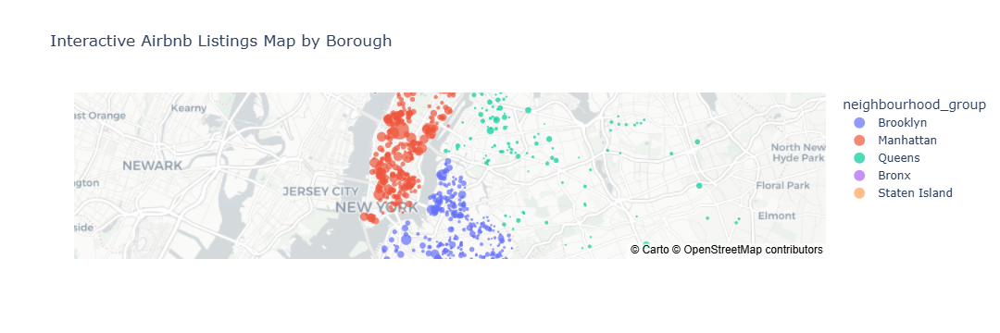

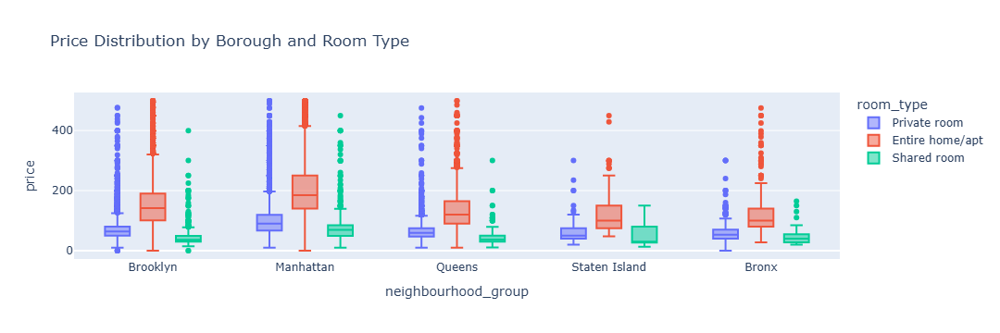


📈 Static Visualizations (Plotly Alternative):


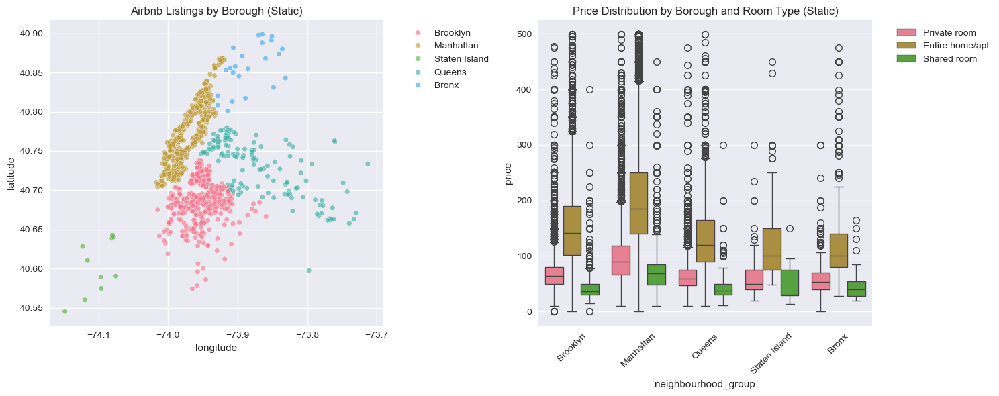

In [36]:
print("📊 Interactive Visualizations")
print("=" * 50)

if 'df_clean' not in globals():
    df_clean = df.copy()
    print("⚠️ Created df_clean from original df")

try:
    import plotly.express as px
    fig = px.scatter_mapbox(df_clean.sample(1000), 
                          lat="latitude", 
                          lon="longitude", 
                          color="neighbourhood_group",
                          size="price",
                          size_max=15,
                          zoom=10,
                          mapbox_style="carto-positron",
                          title="Interactive Airbnb Listings Map by Borough",
                          hover_data=["price", "room_type", "neighbourhood"])
    fig.show()
except ImportError:
    print("❌ Plotly not installed. Install with: pip install plotly")
except Exception as e:
    print(f"❌ Interactive map error: {e}")

try:
    import plotly.express as px
    fig2 = px.box(df_clean[df_clean['price'] < 500], 
                 x="neighbourhood_group", 
                 y="price", 
                 color="room_type",
                 title="Price Distribution by Borough and Room Type")
    fig2.show()
except ImportError:
    print("❌ Plotly not installed. Install with: pip install plotly")
except Exception as e:
    print(f"❌ Interactive box plot error: {e}")

print("\n📈 Static Visualizations (Plotly Alternative):")
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(data=df_clean.sample(1000), x='longitude', y='latitude', 
                hue='neighbourhood_group', alpha=0.6, s=30)
plt.title('Airbnb Listings by Borough (Static)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(1, 2, 2)
sns.boxplot(data=df_clean[df_clean['price'] < 500], x='neighbourhood_group', y='price', hue='room_type')
plt.title('Price Distribution by Borough and Room Type (Static)')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [26]:
print("📈 SUMMARY STATISTICS")
print("=" * 50)

summary_stats = pd.DataFrame({
    'Metric': [
        'Total Listings',
        'Unique Hosts',
        'Average Price',
        'Median Price',
        'Average Minimum Nights',
        'Average Number of Reviews',
        'Average Availability (Days/Year)',
        'Most Expensive Borough',
        'Most Common Room Type',
        'Listings with No Reviews'
    ],
    'Value': [
        len(df_clean),
        df_clean['host_id'].nunique(),
        f"${df_clean['price'].mean():.2f}",
        f"${df_clean['price'].median():.2f}",
        f"{df_clean['minimum_nights'].mean():.1f}",
        f"{df_clean['number_of_reviews'].mean():.1f}",
        f"{df_clean['availability_365'].mean():.1f}",
        most_expensive_borough,
        most_common_room_type,
        f"{(df_clean['number_of_reviews'] == 0).sum()} ({(df_clean['number_of_reviews'] == 0).sum()/len(df_clean)*100:.1f}%)"
    ]
})

display(summary_stats)

print("\n🎉 ANALYSIS COMPLETED!")
print("=" * 30)
print("This analysis provides comprehensive insights into the NYC Airbnb market,")
print("helping hosts optimize pricing, travelers find best values, and investors")
print("identify market opportunities.")

📈 SUMMARY STATISTICS


,Metric,Value
0,Total Listings,48895
1,Unique Hosts,37457
2,Average Price,$152.72
3,Median Price,$106.00
4,Average Minimum Nights,7.0
5,Average Number of Reviews,23.3
6,Average Availability (Days/Year),112.8
7,Most Expensive Borough,Manhattan
8,Most Common Room Type,Entire home/apt
9,Listings with No Reviews,10052 (20.6%)



🎉 ANALYSIS COMPLETED!
This analysis provides comprehensive insights into the NYC Airbnb market,
helping hosts optimize pricing, travelers find best values, and investors
identify market opportunities.
